<h1> <center>Gradient Descent + Gradient Boosting</center></h1>
    
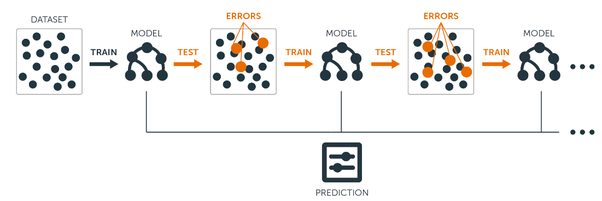
    
<h5><CENTER>TEAM CONTRIBUTOR: ABDULLA MAMUN, RACHAEL OJOPAGOGO, MAPALO LUKASHI</CENTER></h5>

# Table of Contents
- Introduction
- Exploratory Data Analysis
- Data Preparation
- Prepared Data Review
- Classifier Modeling
- Select Models
- Conclusions

# Introduction
The dataset comprised of information pertaining to NY State High School graduation metrics for the 2018-2019 school year. The dataset is sourced from the NY State Education Department [(NYSED)](https://data.nysed.gov/downloads.php). The dataset is comprised of more than 73,000 observations, each of which pertains to a particular NY State school district and associated sub groupings/categorizations of high school students who had been enrolled for at least 4 years as of the end of the 2018-2019 school year. 

__A data dictionary describing the attributes contained within the file is provided below.__

|Data Set Attribute |Description|
|:-------------------|:-----------|
|report_school_year |Indicates school year for which high school graduation info is being reported|
|aggregation_index |Numeric code identifying manner in which high school graduation data has been aggregated|
|aggregation_type |Text description of how high school graduation data has been aggregated|
|aggregation_name | Name of city school with district |
|nrc_code |Numeric code identifying "needs / resource capacity", which is an indicator of the type of school district|
|nrc_desc |Text description of the type of school district|
|county_code |Numeric code for county name|
|county_name |Full name of applicable NY State county|
|nyc_ind |Indicates whether or not the school district resides within the borders of NYC|
|membership_desc |Indicates school year in which students first enrolled in High School|
|subgroup_code |Numeric code identifying student subgrouping|
|subgroup_name |Text description of student subgrouping. Note that a student may belong to MORE THAN ONE subgrouping (e.g., "Female", "Hispanic", "Not English Language Learner", etc.)|
|enroll_cnt |How many students of the indicated subgrouping were enrolled during the given school year|
|grad_cnt |How many enrolled students of the indicated subgrouping graduated at the end of the given school year|
|grad_pct |What percentage of enrolled students of the indicated subgrouping graduated at the end for the given school year|
|reg_cnt |How many enrolled students of the indicated subgrouping were awarded a "Regents" diploma|
|reg_pct |What percentage of enrolled students of the indicated subgrouping were awarded a "Regents" diploma|
|dropout_cnt |How many enrolled students of the indicated subgrouping discontinued their high school enrollment during the school year|
|dropout_pct |What percentage of enrolled students of the indicated subgrouping discontinued their high school enrollment during the school year|

## Project Goal
The main objective for this Project is to apply the full data science project lifecycle to the implementation of regression models. We have to construct a series of different models. Specifically, we will be constructing a decision tree, a random forest, a gradient boosting classifier, a stochastic gradient descent classifier, and an XG Boost classifier. Our work should include EDA, data preparation (including the use of attribute transforms as needed), feature selection, and a thorough evaluation of model performance metrics. 

The response variable we will be modeling will be a categorical indicator variable derived from the dataset’s reg_pct attribute. The new indicator variable will be low, medium and high.

Therefore, our task is to construct and compare/contrast a series of classification models (after completing the necessary EDA and data prep work) that as such, your decision tree and random forest models should be designed for purposes of predicting which of the three required new indicator values is most likely to apply to a given observation.

## Methodology
- Import the necessary python libraries.
- Load the data into Github Repository and then upload that data into python Jupyter Notebook using Pandas reader function.
- Read the data and their information like number of observations, features, data type, individual features missing values, punctuation, and other anomalies inside each feature.
- Visualize the statistical description of each features, creating Univariate, Bivariate, Multivariate analysis, dealing with missing values, duplicate values, outliers, collinearity, feature selection, standardization, model building and compare model performance among models by performance metrics.

In [1]:
%matplotlib inline

## Data Loading & Manipulation
In this section we will import the python libraries, packages for our project work. Also we will see the basic overview of the dataset like number of attributes, observations, data type and some more useful information in details.


In [2]:
# Importing libraries 
import numpy as np
import pandas as pd

# Import library for visualization
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.subplots as sp
import plotly.graph_objs as go

import missingno as msno
import math
from scipy import stats
from sklearn.impute import KNNImputer
from scipy.stats import boxcox
from scipy.stats import zscore
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import cross_val_score

# Import filterwarnngs  from warnings to ignore warnings
import warnings
warnings.filterwarnings("ignore")

# Sets the default figure size to 10 inches in width and 6 inches in height
plt.rcParams['figure.figsize'] = [10, 6] 

In [3]:
# Read a CSV file from the provided URL and store it in a pandas DataFrame (df)
school_report_df = pd.read_csv("https://raw.githubusercontent.com/mamun21616/DAV-6150/main/M11_Data.csv")
# Display the first few rows of the DataFrame to get a quick overview of the data
school_report_df.head()


,report_school_year,aggregation_index,aggregation_type,aggregation_name,nrc_code,nrc_desc,county_code,county_name,nyc_ind,membership_desc,subgroup_code,subgroup_name,enroll_cnt,grad_cnt,grad_pct,reg_cnt,reg_pct,dropout_cnt,dropout_pct
0,2018-19,3,District,ALBANY CITY SCHOOL DISTRICT,3,Urban-Suburban High Needs,1,ALBANY,0,2013 Total Cohort - 6 Year Outcome,1,All Students,658,464,71%,310,47%,148,22%
1,2018-19,3,District,ALBANY CITY SCHOOL DISTRICT,3,Urban-Suburban High Needs,1,ALBANY,0,2013 Total Cohort - 6 Year Outcome,2,Female,324,246,76%,169,52%,65,20%
2,2018-19,3,District,ALBANY CITY SCHOOL DISTRICT,3,Urban-Suburban High Needs,1,ALBANY,0,2013 Total Cohort - 6 Year Outcome,3,Male,334,218,65%,141,42%,83,25%
3,2018-19,3,District,ALBANY CITY SCHOOL DISTRICT,3,Urban-Suburban High Needs,1,ALBANY,0,2013 Total Cohort - 6 Year Outcome,4,American Indian/Alaska Native,-,-,-,-,-,-,-
4,2018-19,3,District,ALBANY CITY SCHOOL DISTRICT,3,Urban-Suburban High Needs,1,ALBANY,0,2013 Total Cohort - 6 Year Outcome,5,Black,367,248,68%,183,50%,91,25%


In [4]:
# Display the dataset total attributes and observations
school_report_df.shape

(73152, 19)

The total number of observations are 73152 and attributes are 29.

In [5]:
# Show the details about the dataset information
school_report_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 73152 entries, 0 to 73151
Data columns (total 19 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   report_school_year  73152 non-null  object
 1   aggregation_index   73152 non-null  int64 
 2   aggregation_type    73152 non-null  object
 3   aggregation_name    73152 non-null  object
 4   nrc_code            73152 non-null  int64 
 5   nrc_desc            73152 non-null  object
 6   county_code         73152 non-null  int64 
 7   county_name         73152 non-null  object
 8   nyc_ind             73152 non-null  int64 
 9   membership_desc     73152 non-null  object
 10  subgroup_code       73152 non-null  int64 
 11  subgroup_name       73152 non-null  object
 12  enroll_cnt          73152 non-null  object
 13  grad_cnt            73152 non-null  object
 14  grad_pct            73152 non-null  object
 15  reg_cnt             73152 non-null  object
 16  reg_pct             73

Dataset observation:

- This is a type of Pandas Dataframe.

- Index ranges from 0-73,151.

- Total number of attributes are 19.

- Majority of the attributes showing  categorical data type. Only few of them are Numerical. In reality thats not true. Most of the numerical columns labeled as categorical. So to verify again we need to check the data type from the dataset for each feature.

- Dataset used computer memory 10.6+ MB.

In [6]:
# Check the data types for each variable
school_report_df.dtypes

report_school_year    object
aggregation_index      int64
aggregation_type      object
aggregation_name      object
nrc_code               int64
nrc_desc              object
county_code            int64
county_name           object
nyc_ind                int64
membership_desc       object
subgroup_code          int64
subgroup_name         object
enroll_cnt            object
grad_cnt              object
grad_pct              object
reg_cnt               object
reg_pct               object
dropout_cnt           object
dropout_pct           object
dtype: object

Obsertvation: Most features data types are not correct, we will make it right format in the following step.

In [7]:
# Function to remove percent sign
def remove_percent(x):
    return x.strip('%')

# Apply the function to each element in the DataFrame
school_report_df[['grad_pct','reg_pct', 'dropout_pct']] = school_report_df[['grad_pct','reg_pct', 'dropout_pct']].applymap(remove_percent)

In [8]:
# List of columns to convert to numeric
columns_to_convert = ['enroll_cnt', 'grad_cnt', 'grad_pct', 'reg_cnt', 'reg_pct', 'dropout_cnt', 'dropout_pct']

# Convert columns to numeric
school_report_df[columns_to_convert] = school_report_df[columns_to_convert].apply(pd.to_numeric, errors='coerce')

In [9]:
# Check data types after changing festures data tye
school_report_df.dtypes

report_school_year     object
aggregation_index       int64
aggregation_type       object
aggregation_name       object
nrc_code                int64
nrc_desc               object
county_code             int64
county_name            object
nyc_ind                 int64
membership_desc        object
subgroup_code           int64
subgroup_name          object
enroll_cnt            float64
grad_cnt              float64
grad_pct              float64
reg_cnt               float64
reg_pct               float64
dropout_cnt           float64
dropout_pct           float64
dtype: object

After changing data type, now looks better for all features data type in right format.

## Taking Subset from the all features which can be most relevant for our EDA purposes.

For example we have some variables like report_school_year, nrc_code, country_code, aggregation_index, aggregation_type. We will ignore these columns because they have no meaning for data analysis. We use all data for year 2018-2019.No need to show this duration for each row. These features can be use for reference and understanding. In addition to that, some columns are duplicate like count and percent. So we will keep only count column instead of percentage because they have same meaning.

The following subset of features we will work from now.

In [10]:
# Selecting only the desired features (columns) from the original dataframe
selected_features = ['nrc_desc', 'county_name', 'nyc_ind', 'membership_desc', 'subgroup_name',
                     'enroll_cnt', 'grad_cnt', 'grad_pct', 'reg_cnt', 'reg_pct', 'dropout_cnt', 'dropout_pct']

# Creating a new dataframe with only the selected features
df_selected_features = school_report_df[selected_features]

# Displaying the new dataframe
df_selected_features.head()

,nrc_desc,county_name,nyc_ind,membership_desc,subgroup_name,enroll_cnt,grad_cnt,grad_pct,reg_cnt,reg_pct,dropout_cnt,dropout_pct
0,Urban-Suburban High Needs,ALBANY,0,2013 Total Cohort - 6 Year Outcome,All Students,658.0,464.0,71.0,310.0,47.0,148.0,22.0
1,Urban-Suburban High Needs,ALBANY,0,2013 Total Cohort - 6 Year Outcome,Female,324.0,246.0,76.0,169.0,52.0,65.0,20.0
2,Urban-Suburban High Needs,ALBANY,0,2013 Total Cohort - 6 Year Outcome,Male,334.0,218.0,65.0,141.0,42.0,83.0,25.0
3,Urban-Suburban High Needs,ALBANY,0,2013 Total Cohort - 6 Year Outcome,American Indian/Alaska Native,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Urban-Suburban High Needs,ALBANY,0,2013 Total Cohort - 6 Year Outcome,Black,367.0,248.0,68.0,183.0,50.0,91.0,25.0


In [11]:
# Check the membership description feature
df_selected_features['membership_desc'].value_counts()

2015 Total Cohort - 4 Year Outcome                  12299
2015 Total Cohort - 4 Year Outcome - August 2019    12299
2014 Total Cohort - 5 Year Outcome                  12257
2014 Total Cohort - 5 Year Outcome - August 2019    12257
2013 Total Cohort - 6 Year Outcome                  12020
2013 Total Cohort - 6 Year Outcome - August 2019    12020
Name: membership_desc, dtype: int64

__From the value count method We can see that every year we have two observation. That is not normal. We will merge these data in one year like for 1013, 2014, 2015 with 6, 5, 4 year outcome.__

__As we can see that each year has two outcomes, that can be misleading. So we can do merge into one year and their duration of outcomes__

In [12]:
# Extract the year and outcome information using regular expressions
df_selected_features['year'] = df_selected_features['membership_desc'].str.extract(r'(\d{4})')

# Set new row value based on specific conditions
df_selected_features['membership_desc'] = df_selected_features['year'].apply(
    lambda x: '2013-19 6yr outcome' if x == '2013' else ('2014-19 5yr outcome' if x == '2014' else '2015-19 4yr outcome')
)

In [13]:
# Display the outcomes for each year with their duration
df_selected_features['membership_desc'].value_counts()

2015-19 4yr outcome    24598
2014-19 5yr outcome    24514
2013-19 6yr outcome    24040
Name: membership_desc, dtype: int64

Now its look way better than earlier. As we have succesfully merged the years and outcomes accordingly.

# Exploratory Data Analysis
Analyzing a data set for purposes of summarizing its characteristics, identifying relationships between its attributes, and discovering patterns, trends, outliers, missing values and invalid values within the data. In this EDA process start with Univariate analysis, bivariate analysis and multivariate analysis.

Now we will present the Descriptive Statistics for each variable.

In [14]:
# Display descriptive statistics for all columns, including object and categorical types
df_selected_features.describe(include = 'all')

,nrc_desc,county_name,nyc_ind,membership_desc,subgroup_name,enroll_cnt,grad_cnt,grad_pct,reg_cnt,reg_pct,dropout_cnt,dropout_pct,year
count,73152,73152,73152.000000,73152,73152,39674.000000,39674.000000,39674.000000,39674.000000,39674.000000,39674.000000,39674.000000,73152
unique,6,62,NaN,3,24,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3
top,Average Needs,SUFFOLK,NaN,2015-19 4yr outcome,All Students,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2015
freq,35322,6526,NaN,24598,4074,NaN,NaN,NaN,NaN,NaN,NaN,NaN,24598
mean,NaN,NaN,0.055255,NaN,NaN,192.120079,161.178354,84.406614,86.804708,43.371125,16.239225,7.963049,NaN
std,NaN,NaN,0.228479,NaN,NaN,439.972474,361.294773,15.679500,225.795826,17.124891,50.129834,9.658698,NaN
min,NaN,NaN,0.000000,NaN,NaN,5.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN
25%,NaN,NaN,0.000000,NaN,NaN,25.000000,20.000000,79.000000,10.000000,33.000000,1.000000,1.000000,NaN
50%,NaN,NaN,0.000000,NaN,NaN,66.000000,57.000000,89.000000,27.000000,43.000000,3.000000,5.000000,NaN
75%,NaN,NaN,0.000000,NaN,NaN,179.000000,156.000000,95.000000,69.000000,53.000000,9.000000,11.000000,NaN


__Observations__

- At first we can see that aggregation name, nrc description, country name, nyc ind, membership description, subgroup name, year columns have total observations 73152 but rest of the numerical features have not full observations, they contain only 39674 observations. We need to look into that missing observations.
- For categorical features we derived total number of unique count, top object and frequency for each variable.
- For numerical attributes we derived mean, median, 25%, 75%, minimum and maximum value for each and individual feature. 

## Check the duplicate values

In [15]:
# Find duplicate rows in the DataFrame based on all columns
duplicates = df_selected_features[df_selected_features.duplicated()]

# Display duplicate rows
duplicates

,nrc_desc,county_name,nyc_ind,membership_desc,subgroup_name,enroll_cnt,grad_cnt,grad_pct,reg_cnt,reg_pct,dropout_cnt,dropout_pct,year
69,Urban-Suburban High Needs,ALBANY,0,2014-19 5yr outcome,American Indian/Alaska Native,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2014
74,Urban-Suburban High Needs,ALBANY,0,2014-19 5yr outcome,Multiracial,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2014
76,Urban-Suburban High Needs,ALBANY,0,2014-19 5yr outcome,Students with Disabilities,114.0,54.0,47.0,14.0,12.0,33.0,29.0,2014
79,Urban-Suburban High Needs,ALBANY,0,2014-19 5yr outcome,Formerly English Language Learner,6.0,6.0,100.0,4.0,67.0,0.0,0.0,2014
82,Urban-Suburban High Needs,ALBANY,0,2014-19 5yr outcome,Migrant,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2014
...,...,...,...,...,...,...,...,...,...,...,...,...,...
73147,Rural High Needs,YATES,0,2013-19 6yr outcome,Not Migrant,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2013
73148,Rural High Needs,YATES,0,2013-19 6yr outcome,Homeless,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2013
73149,Rural High Needs,YATES,0,2013-19 6yr outcome,Not Homeless,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2013
73150,Rural High Needs,YATES,0,2013-19 6yr outcome,Not in Foster Care,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2013


 There are 31730 rows that have identical values in all columns with some previous row. This is really huge , its almost 50% of our full data.
 We want to keep the first occurrence of each duplicated row and drop the subsequent ones.

In [16]:
# Remove exact duplicates
df_selected_features.drop_duplicates(keep = 'first', inplace=True)

In [17]:
# Display the number of observations remain after removing the duplicates
len(df_selected_features)

29781

In [18]:
# Check agian if there is any duplicate rows exist yet or not
len(df_selected_features[df_selected_features.duplicated()])


0

Observation: We now have checked and verified that there are no more duplicate values as the result from the check shows zero duplicates.

## Identify null values

In [19]:
# Check for missing values
df_selected_features.isnull().sum()

nrc_desc              0
county_name           0
nyc_ind               0
membership_desc       0
subgroup_name         0
enroll_cnt         5116
grad_cnt           5116
grad_pct           5116
reg_cnt            5116
reg_pct            5116
dropout_cnt        5116
dropout_pct        5116
year                  0
dtype: int64

In [20]:
# Calculate the percentage of missing values for each column
missing_percentages = df_selected_features.isnull().mean() * 100

# Display the percentage of missing values
print(missing_percentages)

nrc_desc            0.000000
county_name         0.000000
nyc_ind             0.000000
membership_desc     0.000000
subgroup_name       0.000000
enroll_cnt         17.178738
grad_cnt           17.178738
grad_pct           17.178738
reg_cnt            17.178738
reg_pct            17.178738
dropout_cnt        17.178738
dropout_pct        17.178738
year                0.000000
dtype: float64


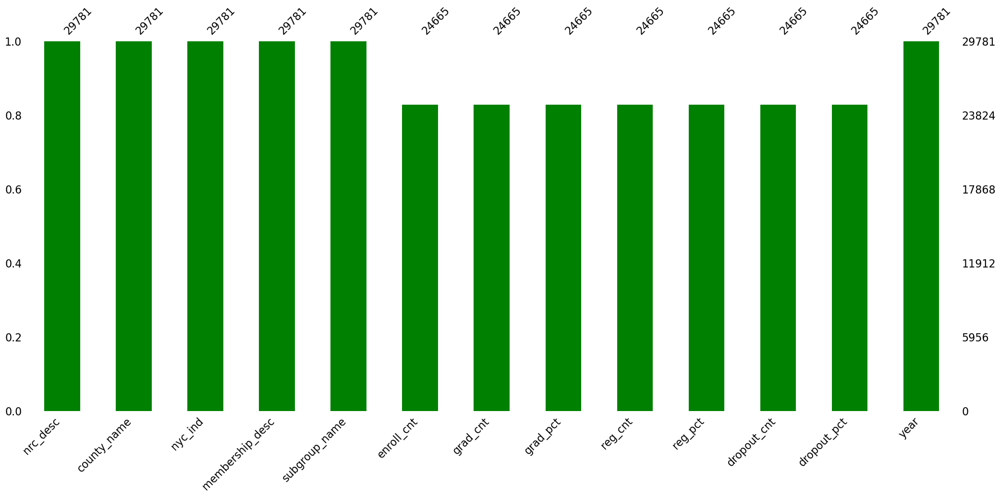

In [21]:
# Create a bar chart visualization of missing values
msno.bar(df_selected_features, color='green')

# Display the plot
plt.show();

Out of 14 variables, 7 variables contains around 17% missing values, which are huge.  

## Outliers Detection

In [22]:
df_selected_features.head()

,nrc_desc,county_name,nyc_ind,membership_desc,subgroup_name,enroll_cnt,grad_cnt,grad_pct,reg_cnt,reg_pct,dropout_cnt,dropout_pct,year
0,Urban-Suburban High Needs,ALBANY,0,2013-19 6yr outcome,All Students,658.0,464.0,71.0,310.0,47.0,148.0,22.0,2013
1,Urban-Suburban High Needs,ALBANY,0,2013-19 6yr outcome,Female,324.0,246.0,76.0,169.0,52.0,65.0,20.0,2013
2,Urban-Suburban High Needs,ALBANY,0,2013-19 6yr outcome,Male,334.0,218.0,65.0,141.0,42.0,83.0,25.0,2013
3,Urban-Suburban High Needs,ALBANY,0,2013-19 6yr outcome,American Indian/Alaska Native,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2013
4,Urban-Suburban High Needs,ALBANY,0,2013-19 6yr outcome,Black,367.0,248.0,68.0,183.0,50.0,91.0,25.0,2013


### Box plot for outlier detection

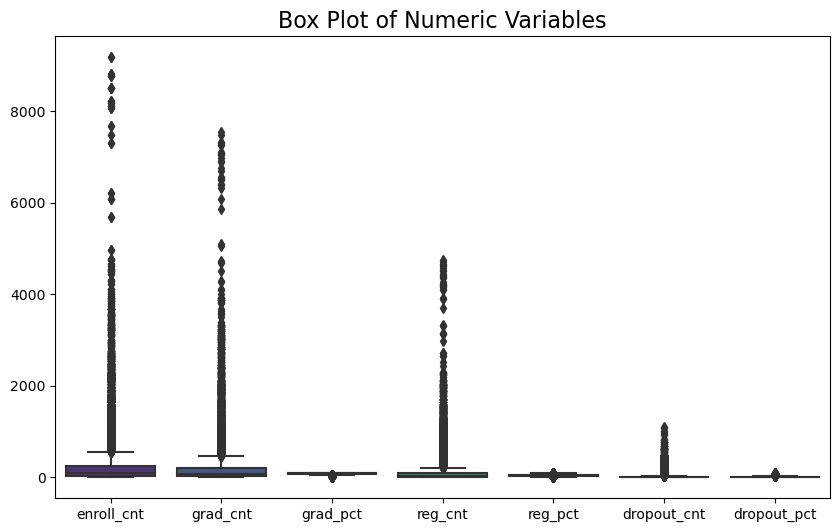

In [23]:
# Select the numerical columns from the DataFrame is named 'df_selected_features'
numeric_columns = df_selected_features.select_dtypes(include=['float64']).columns

# Create a Box plot for each numeric variable
sns.boxplot(data=df_selected_features[numeric_columns], palette='viridis')
# Set the title of the plot
plt.title('Box Plot of Numeric Variables', fontsize=16)
# Display the plot
plt.show();

Observation: We have noticed the presence of many outliers beyond the 'maximum' value of the interquartile range. Hence, the need to consider handling outlier in data preparation.

We will further investigate the outliers using QQ plots below and use our insights to determine our data preparation action on outliers.

### QQ plot for outliers detection

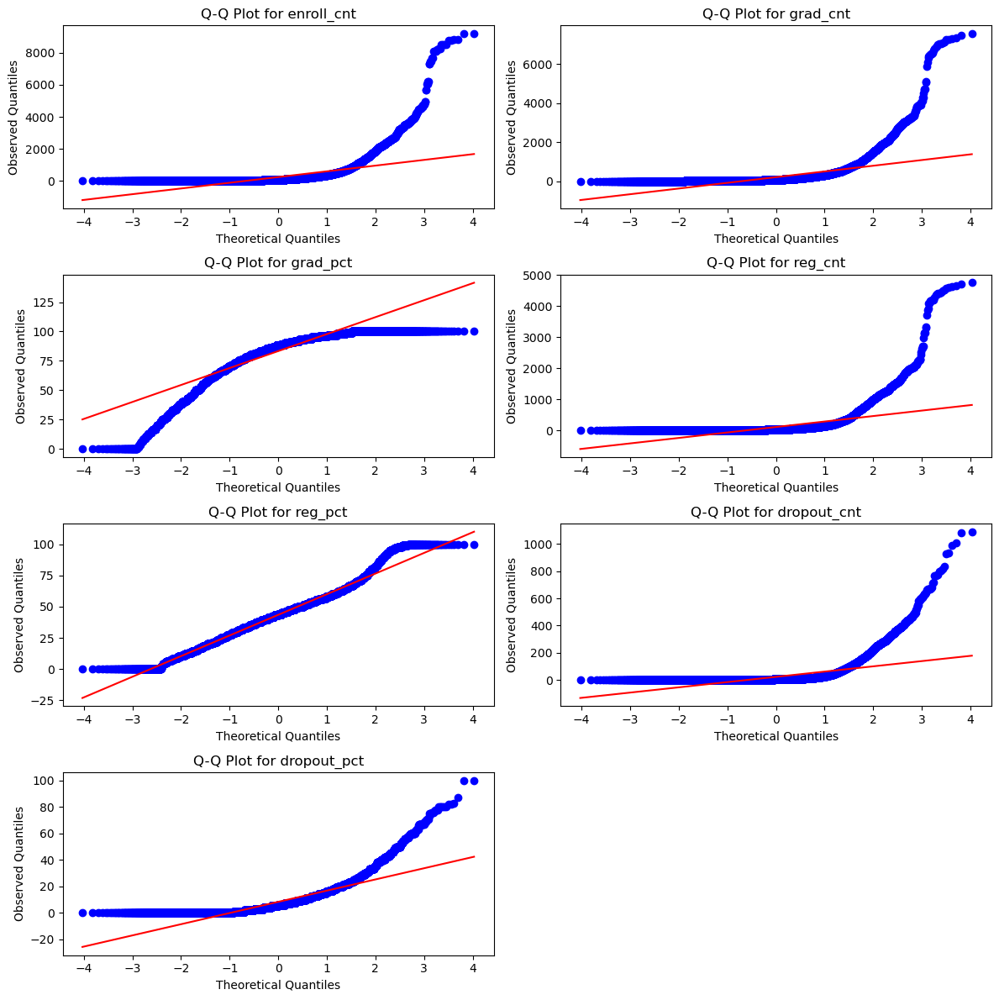

In [24]:
# Define function for qq plot 
def plot_qq_plots(data_frame):
    """
    Generate Q-Q plots for each numeric variable in a DataFrame.

    Parameters:
    - data_frame (pd.DataFrame): The input DataFrame containing numeric variables.

    Returns:
    None

    Example:
    plot_qq_plots(df_selected_features)
    """
    numeric_columns = data_frame.select_dtypes(include=['float64']).columns

    num_plots = len(numeric_columns)
    num_cols = 2
    num_rows = math.ceil(num_plots / num_cols)

    fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(12, 3 * num_rows))

    for i, column in enumerate(numeric_columns):
        row, col = divmod(i, num_cols)
        ax = axes[row, col]

        stats.probplot(data_frame[column].dropna(), dist='norm', plot=ax)

        ax.set_title(f'Q-Q Plot for {column}')
        ax.set_xlabel('Theoretical Quantiles')
        ax.set_ylabel('Observed Quantiles')

    for i in range(num_plots, num_rows * num_cols):
        fig.delaxes(axes.flatten()[i])

    plt.tight_layout()
    plt.show()


# Call the function with our DataFrame
plot_qq_plots(df_selected_features)


__It is clearly visible for all the numerical features have outliers and due to outliers they are skewed.__

## Univariate Analysis

### Categorical Features Univariate Analysis

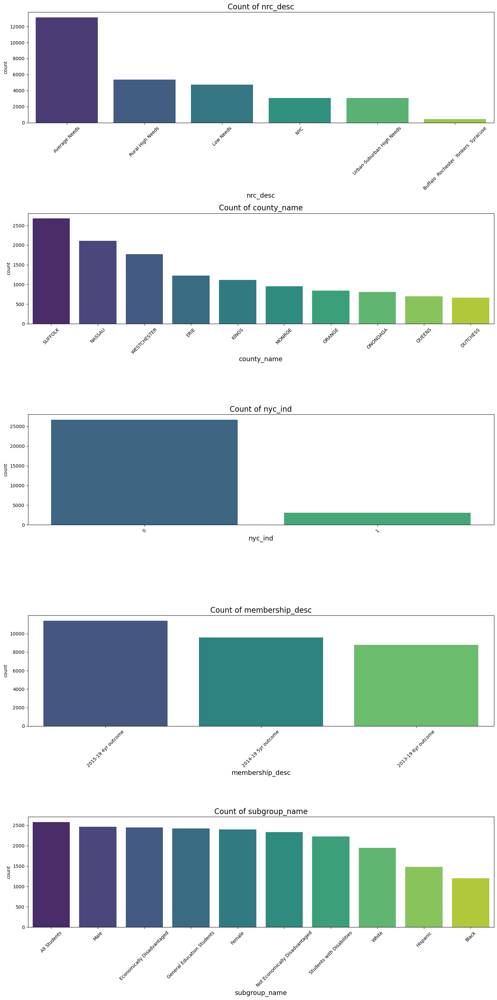

In [25]:
# Function to visualize counts of categorical variables side by side
def visualize_categorical_counts(dataframe, categorical_columns):
    """
    Visualize counts of categorical variables side by side using countplots.

    Parameters:
    - dataframe (pd.DataFrame): The input DataFrame containing the categorical variables.
    - categorical_columns (list): List of column names corresponding to categorical variables.

    Returns:
    None

    Example:
    visualize_categorical_counts(df_selected_features, ['nrc_desc', 'county_name', 'nyc_ind', 'membership_desc', 'subgroup_name'])
    """
    num_plots = len(categorical_columns)
    num_cols = min(num_plots, 1)  # Number of columns in each row

    # Calculate the number of rows needed
    num_rows = math.ceil(num_plots / num_cols)

    # Create subplots
    fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(15, 6 * num_rows))

    # Flatten the axes array for easy indexing
    axes = axes.flatten()

    for i, column in enumerate(categorical_columns):
        # Select the current axis
        ax = axes[i]

        # Countplot with title, x-axis label orientation, sorting, and top 10 categories
        sns.countplot(x=column, data=dataframe, order=dataframe[column].value_counts().index[:10], palette='viridis', ax=ax)
        ax.set_title(f'Count of {column}', fontsize=16)
        ax.set_xlabel(column, fontsize=14)
        ax.tick_params(axis='x', rotation=45)  # Rotate x-axis labels for better visibility

    # Adjust layout and show the plots
    plt.tight_layout()
    plt.show()

# Assuming your DataFrame is named 'df_selected_features'
visualize_categorical_counts(df_selected_features, ['nrc_desc', 'county_name', 'nyc_ind', 'membership_desc', 'subgroup_name'])


NYSED classifies school districts by a measure that takes into account both their degree of pupil need and their fiscal capacity. This measure is the need/resource capacity (NRC) index. While the need/resource capacity index is a continuous measure, NYSED uses it as a categorical variable as well. SED has defined six need/resource categories: New York City, the Big Four City School Districts (Buffalo, Rochester, Syracuse and Yonkers), high need urban/suburban districts, high need rural districts, average need districts, and low need districts.[1]

Figure show from 2018-2019, the average need, high need rural districts and low needs debt payments (upper group) were the highest group. The lowest group comprised three need resource categories; the Big Four, NYC and high need urban/suburban categories. Although these need resource categories are very different from each other.

In case of Membership description highest value for 4 year outcome. 

For NYC_DEC most of the time school district was not out of borders, therefore 0 value count was higher than 1. One means out of border.

### Numerical Features Univaraite Analysis

In [26]:
def numerical_univariate_analysis(data, numerical_columns):
    """
    Generate a grid of Box Plots and Histograms for numerical columns in a DataFrame.

    Parameters:
    - data (pd.DataFrame): The input DataFrame containing numerical columns.
    - numerical_columns (list): List of column names corresponding to numerical variables.

    Returns:
    None

    Example:
    numerical_columns = ['enroll_cnt', 'grad_cnt', 'local_cnt', 'reg_cnt', 'reg_adv_cnt', 'non_diploma_credential_cnt',
                          'still_enr_cnt', 'ged_cnt', 'dropout_cnt']
    numerical_univariate_analysis(df_selected_features, numerical_columns)
    """
    rows = len(numerical_columns)
    fig = sp.make_subplots(rows=rows, cols=2, subplot_titles=["Box Plot", "Histogram"])

    for i, column in enumerate(numerical_columns, 1):
        # Box Plot
        trace_box = go.Box(x=data[column], name=column)
        fig.add_trace(trace_box, row=i, col=1)

        # Histogram
        trace_hist = go.Histogram(x=data[column], nbinsx=20, name=column)
        fig.add_trace(trace_hist, row=i, col=2)

        # Update x-axis and y-axis labels
        fig.update_xaxes(title_text=column, row=i, col=1)
        fig.update_xaxes(title_text=column, row=i, col=2)
        fig.update_yaxes(title_text="Count", row=i, col=2)

    # Update layout
    fig.update_layout(showlegend=False, height=rows * 400, title_text="Numerical Univariate Analysis")

    # Show the plot
    fig.show()

# Assuming df_selected_features is your DataFrame
numerical_columns = ['enroll_cnt', 'grad_cnt', 'grad_pct', 'reg_cnt', 'reg_pct','dropout_cnt', 'dropout_pct', 'year']
numerical_univariate_analysis(df_selected_features, numerical_columns)

As we already have see the outliers in previous section and now from univariate analysis plot of histogram and box plot we can also identify and make sure that due to outliers, missing values, we have skewed distribution. 

## Bivariate analysis 

### Relationship between Enrollment count and dropout count

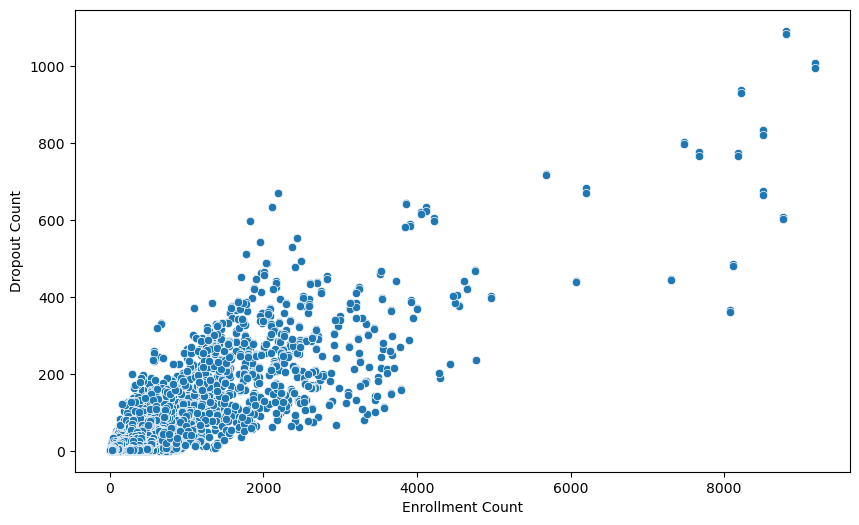

In [27]:
# Create a scatter plot
sns.scatterplot(x='enroll_cnt', y='dropout_cnt', data=df_selected_features)

# Set x-axis label
plt.xlabel('Enrollment Count')

# Set y-axis label
plt.ylabel('Dropout Count')

# Display the plot
plt.show();

Between Enrollment and Dropout count have positive relationship, which defines as the more enrollment the more dropout rate of percentage.

### Relationship between Enrollment count and Graduate count

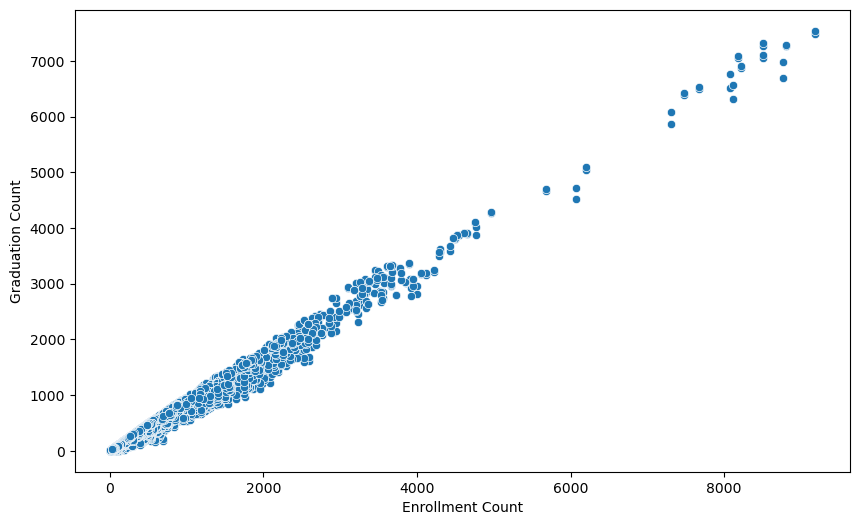

In [28]:
# Create a scatter plot
sns.scatterplot(x='enroll_cnt', y='grad_cnt', data=df_selected_features)

# Set x-axis label
plt.xlabel('Enrollment Count')

# Set y-axis label
plt.ylabel('Graduation Count')

# Display the plot
plt.show();

Then more enrollment the more graduation. These two features exists stronger positive relationship. But for our prediction purpose, we cannot use two inter correlated variable for prediction, we have to remove one of them to predict our dropout count.

### Relationship between Enrollment count and Regents Diploma count

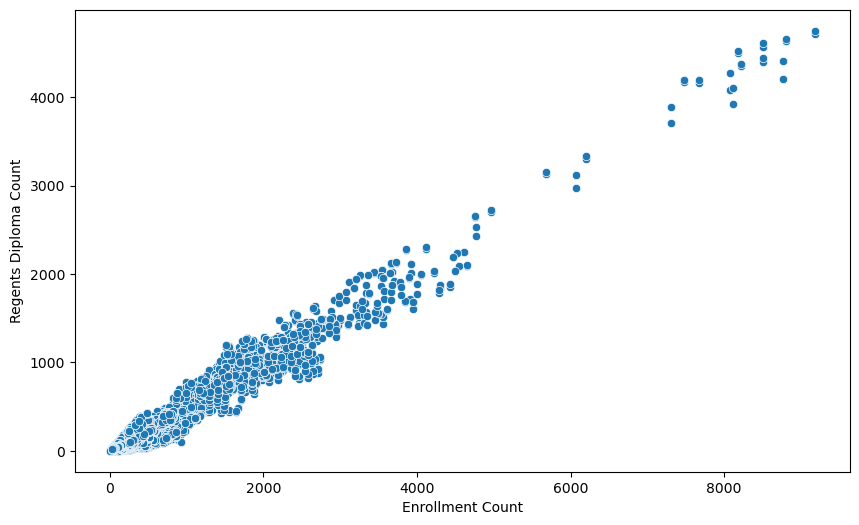

In [29]:
# Create a scatter plot
sns.scatterplot(x='enroll_cnt', y='reg_cnt', data=df_selected_features)

# Set x-axis label
plt.xlabel('Enrollment Count')

# Set y-axis label
plt.ylabel('Regents Diploma Count')

# Display the plot
plt.show();

Relationship between these to features are same as previous one, they are correlated each other.

### Display the Relationship between categorical features and Target feature

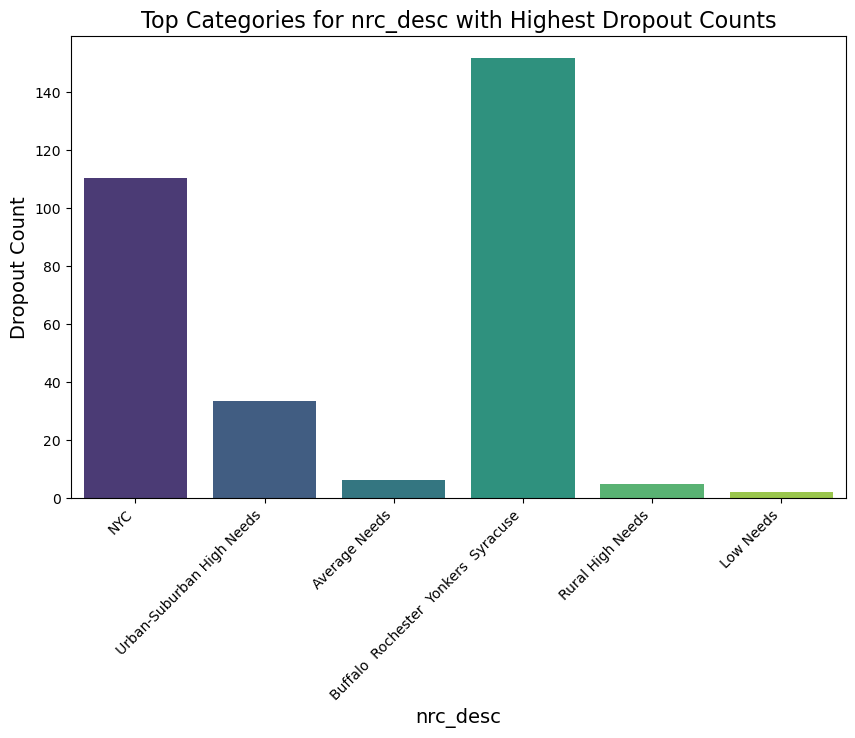

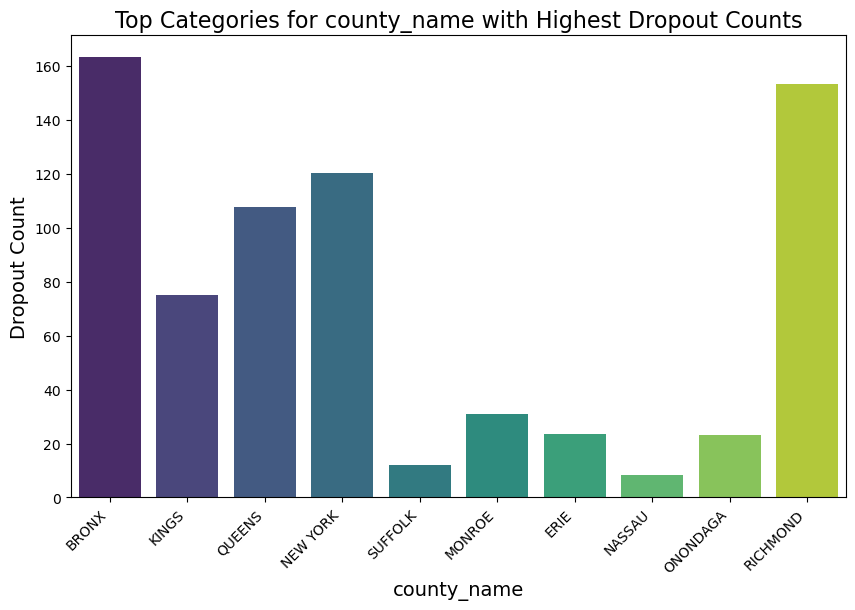

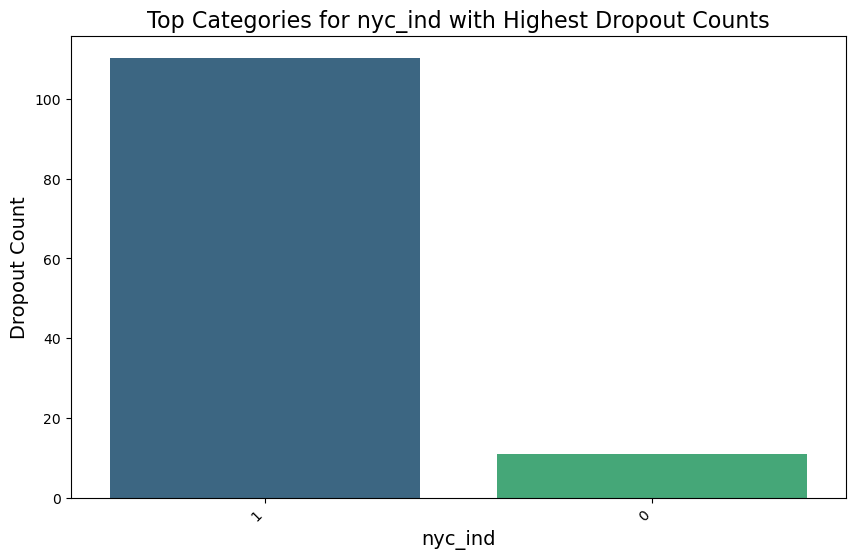

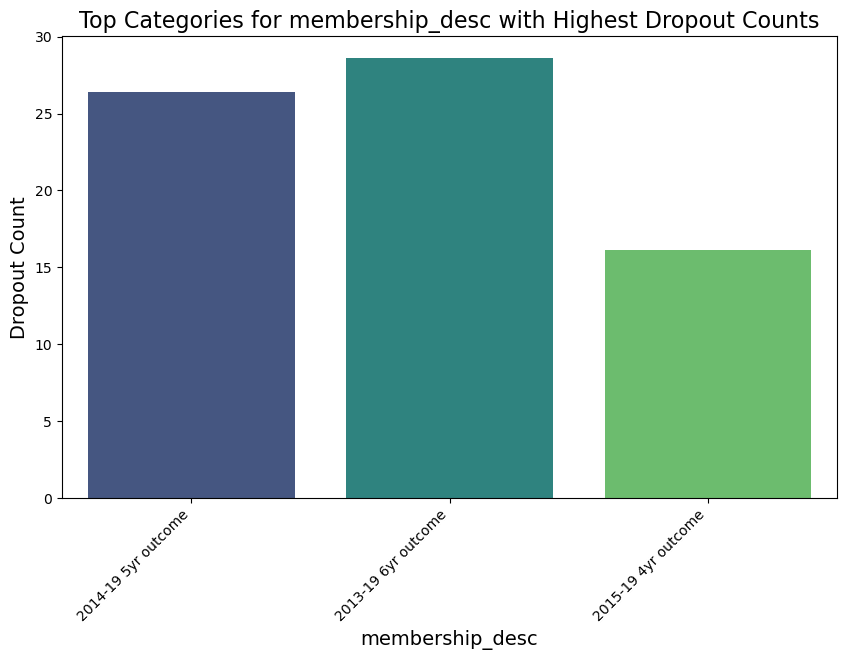

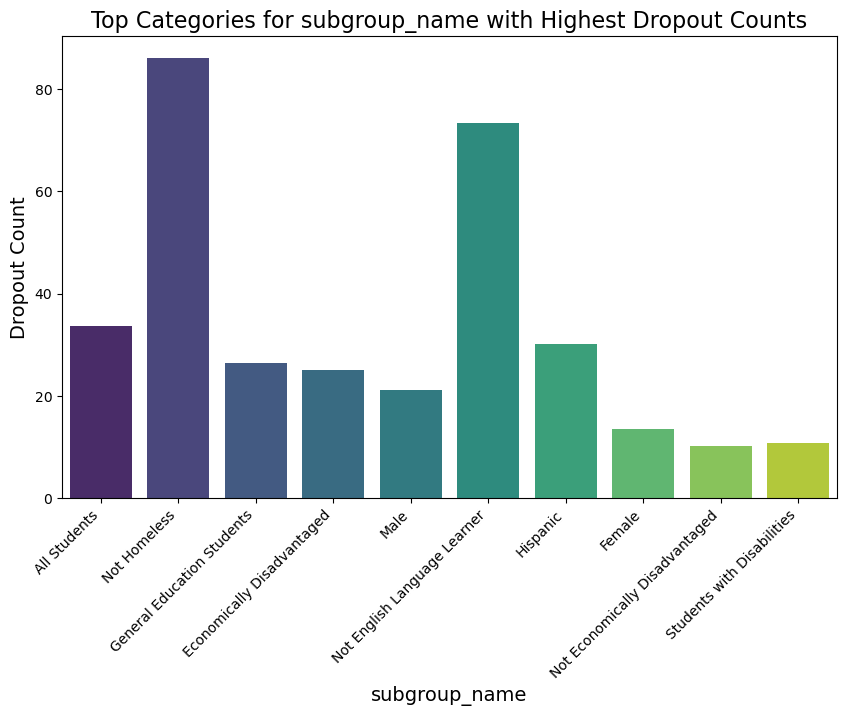

In [30]:
# Define a function which will help us to visualize bivariate analysis plot
def visualize_categorical_dropout_relationship(dataframe, categorical_columns):
    """
    Visualize the relationship between each categorical column and 'dropout_cnt'.

    Parameters:
    - dataframe: DataFrame containing the data
    - categorical_columns: List of categorical columns to visualize

    Returns:
    None (Plots will be displayed)
    """
    for column in categorical_columns:
        # Calculate the top categories with the highest dropout counts
        top_categories = dataframe.groupby(column)['dropout_cnt'].sum().nlargest(10).index

        # Filter the DataFrame for the top categories
        df_top_categories = dataframe[dataframe[column].isin(top_categories)]

        # Bar plot for the categorical column with 'dropout_cnt'
        sns.barplot(x=column, y='dropout_cnt', data=df_top_categories, ci=None, palette='viridis', order=top_categories)
        plt.title(f'Top Categories for {column} with Highest Dropout Counts', fontsize=16)
        plt.xlabel(column, fontsize=14)
        plt.ylabel('Dropout Count', fontsize=14)
        plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better visibility
        plt.show()

# Example usage:
categorical_columns = ['nrc_desc', 'county_name', 'nyc_ind', 'membership_desc', 'subgroup_name']
visualize_categorical_dropout_relationship(df_selected_features, categorical_columns)


Fig1: Top 10 dropout school from NYC district.

Fig2: For NRC_desc city school district of NYC has the second highest dropout rate where top most were(Buffalo Rochester Yonkers Syracuse).

Fig3: Based on county name BRONX was the highest dropout county and second highest was Richmond. Suffolk and Nassau had very less dropout count.

Fig4: The number of school district resides outside the borders of NYC was less, so dropout number also less.

Fig5: For membership description as the number of year outcome increase from 4-6 year, the number of dropout students increased accordingly. Less year duration has less dropout rate.

Fig6: Subgroup name "Not Homeless" and "Not English Language Learner" have the highest dropout count compare to others and also Male has more dropout rate than female. In addition to that, the students who are economically advantaged they have less prone to dropout.

## Multivariate Analysis

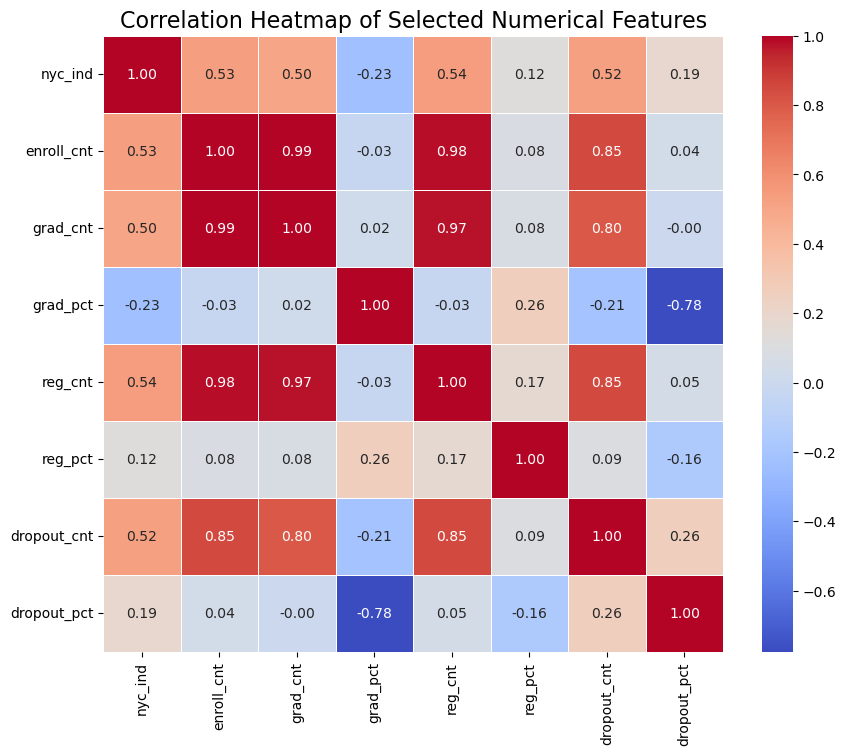

In [31]:
# Calculate the correlation matrix
correlation_matrix = df_selected_features.corr()

# Create a heatmap
plt.figure(figsize=(10, 8))

# Plot the heatmap using seaborn
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)

# Add title to the heatmap
plt.title('Correlation Heatmap of Selected Numerical Features', fontsize=16)

# Display the plot
plt.show();


Observation: We can tell that there are positive correlations among the variables, and we are also particularly interested in identifying possible multi collinearities among explanatory variables, so that we can omit one or more of multi colinear attributes, to avoid noise during our machine learning model.

The correlation matrix gives us more valuable insights about Multicollinearity, Relationship strength with response variable. We can take best feature from here as well which have strong correlation with response variable. 
Enrollment count with Regents diploma count, graduate count are highly correlated each other. 

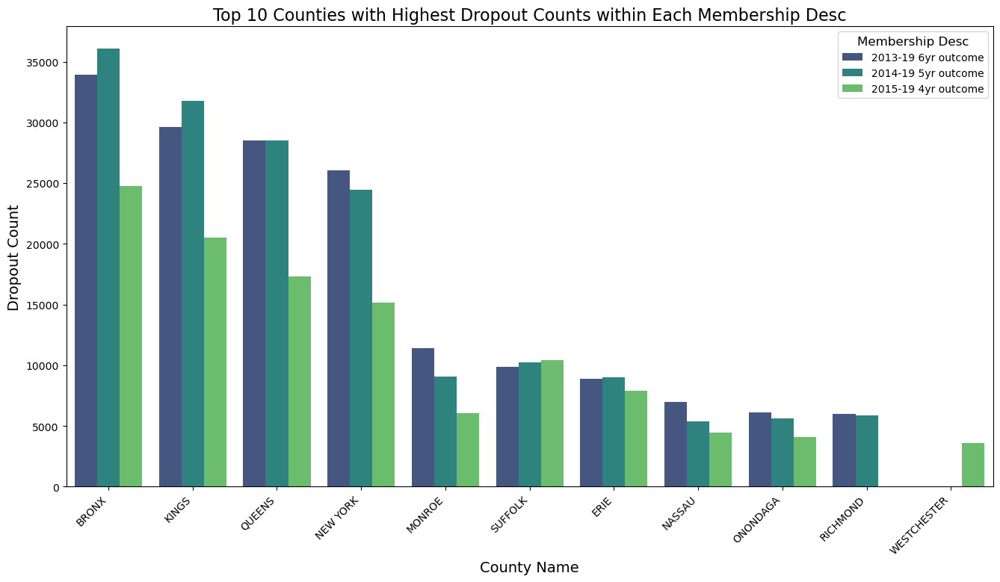

In [32]:
# Calculate the top 10 counties with the highest dropout counts within each membership_desc
top_counties_by_membership = (
    df_selected_features.groupby(['membership_desc', 'county_name'])['dropout_cnt']
    .sum()
    .groupby('membership_desc', group_keys=False)
    .nlargest(10)
    .reset_index()
)

# Bar plot for 'county_name' with 'dropout_cnt' (descending and top 10) within each 'membership_desc'
plt.figure(figsize=(16, 8))
sns.barplot(x='county_name', y='dropout_cnt', hue='membership_desc', data=top_counties_by_membership, palette='viridis')
plt.title('Top 10 Counties with Highest Dropout Counts within Each Membership Desc', fontsize=16)
plt.xlabel('County Name', fontsize=14)
plt.ylabel('Dropout Count', fontsize=14)
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better visibility
plt.legend(title='Membership Desc', title_fontsize='12', loc='upper right')
plt.show()


Bronx, Kings, Queens and New York county were the top for dropout numbers. May be their number of students volume higher, more schools availability, people move frequently or can also be other reason. 

In Bronx and kings only 6 yrs outcome has the highest dropout numbers and other counties 5&6 are very close to each other compare to 4 yr outcome.

# Data Preparation

In Data Preparation we will, care about filling missing values, handling outliers mainly as we already removed duplicate values in previous section. 

In [33]:
# Step 1: Calculate the median percentage of regents diplomas awarded
median_reg_pct = df_selected_features['dropout_pct'].median()

# Step 2: Define categories
low_threshold = 0.5 * median_reg_pct
high_threshold = 1.5 * median_reg_pct

# Step 3: Assign each observation to a category
def assign_category(reg_pct):
    if reg_pct < low_threshold:
        return 'low'
    elif low_threshold <= reg_pct <= high_threshold:
        return 'medium'
    else:
        return 'high'

# Create the new indicator variable
df_selected_features['dropout_pct_level'] = df_selected_features['dropout_pct'].apply(assign_category)

# Display the updated DataFrame
df_selected_features['dropout_pct_level'].value_counts()


high      13013
medium     9114
low        7654
Name: dropout_pct_level, dtype: int64

In [34]:
df_selected_features.head()

,nrc_desc,county_name,nyc_ind,membership_desc,subgroup_name,enroll_cnt,grad_cnt,grad_pct,reg_cnt,reg_pct,dropout_cnt,dropout_pct,year,dropout_pct_level
0,Urban-Suburban High Needs,ALBANY,0,2013-19 6yr outcome,All Students,658.0,464.0,71.0,310.0,47.0,148.0,22.0,2013,high
1,Urban-Suburban High Needs,ALBANY,0,2013-19 6yr outcome,Female,324.0,246.0,76.0,169.0,52.0,65.0,20.0,2013,high
2,Urban-Suburban High Needs,ALBANY,0,2013-19 6yr outcome,Male,334.0,218.0,65.0,141.0,42.0,83.0,25.0,2013,high
3,Urban-Suburban High Needs,ALBANY,0,2013-19 6yr outcome,American Indian/Alaska Native,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2013,high
4,Urban-Suburban High Needs,ALBANY,0,2013-19 6yr outcome,Black,367.0,248.0,68.0,183.0,50.0,91.0,25.0,2013,high


In [35]:
# Remove the "dropout_pct" and "dropout_cnt" attributes
df_selected_features.drop(['dropout_pct', 'dropout_cnt', 'year'], axis=1, inplace=True)


## Handle Missing Values:

Before transforming the data or dealing with outliers, it's crucial to address missing values.
Use an imputation method to fill in missing values. You mentioned using the K-nearest neighbors (KNN) imputation, so let's proceed with that.

In [36]:
# Check for missing values in each column and sum them up
missing_values = df_selected_features.isna().sum()

# Display the results
print(missing_values)

nrc_desc                0
county_name             0
nyc_ind                 0
membership_desc         0
subgroup_name           0
enroll_cnt           5116
grad_cnt             5116
grad_pct             5116
reg_cnt              5116
reg_pct              5116
dropout_pct_level       0
dtype: int64


### Fill the missing values with K-Nearest Neighbor method

In [41]:
numeric_columns1 = ['enroll_cnt', 'grad_cnt', 'grad_pct', 'reg_cnt', 'reg_pct']
# Create transformers for numerical and categorical columns
numerical_transformer = KNNImputer(n_neighbors=5)

# Apply transformers to numerical and categorical columns
df_selected_features[numeric_columns1] = numerical_transformer.fit_transform(df_selected_features[numeric_columns1])


In [42]:
# Check for missing values in each column and sum them up
missing_values = df_selected_features.isna().sum()

# Display the results
print(missing_values)

nrc_desc             0
county_name          0
nyc_ind              0
membership_desc      0
subgroup_name        0
enroll_cnt           0
grad_cnt             0
grad_pct             0
reg_cnt              0
reg_pct              0
dropout_pct_level    0
dtype: int64


Observation: The KNN-Imputer we coded has imputed Missing values across the attributes, hence now all missing values have been addressed. Now we can procced with dealing with outliers and transformation issues.

## Apply Box-Cox Transformation:

After addressing missing values we can now apply the Box-Cox transformation before dealing with outliers.

In [43]:
from scipy.stats import boxcox

# Select only numerical columns for Box-Cox transformation
numeric_columns1 = df_selected_features.select_dtypes(include=np.number).columns

# Apply Box-Cox transformation to each numerical column
for column in numeric_columns1:
    # Add 1 to handle zero values
    transformed_data, _ = boxcox(df_selected_features[column] + 1)
    df_selected_features[column] = transformed_data

## Handle Outliers:

Since we have addressed the missing values and the transformation, we now proceed to handle outliers. We shall use Z_score methods to handle outliers.

In [44]:
from scipy.stats import zscore

# Calculate Z-scores for each column 
z_scores = np.abs(zscore(df_selected_features[numeric_columns1]))

# Set a threshold for outlier detection (e.g., z_score_threshold = 3)
z_score_threshold = 3
outliers = (z_scores > z_score_threshold).any(axis=1)

# Remove outliers from the DataFrame
df_no_outliers = df_selected_features[~outliers]

Observation: For selecting our Z-Score threshold as 3, we follow a general guideline that considers data points as outliers if they have a Z-Score less than -3 or greater than +3. This guideline is based on the empirical rule in statistics, which states that for a normal distribution, about 68% of the data falls within one standard deviation of the mean. About 95% falls within two standard deviations, about 99.7% within three standard deviations.

# Data Prepped Review

In this section we will display the work done in data preparation and see the difference after cleaning the data. View the data distribution after removing outliers with QQ plot.

### Checking for Outlier Removal

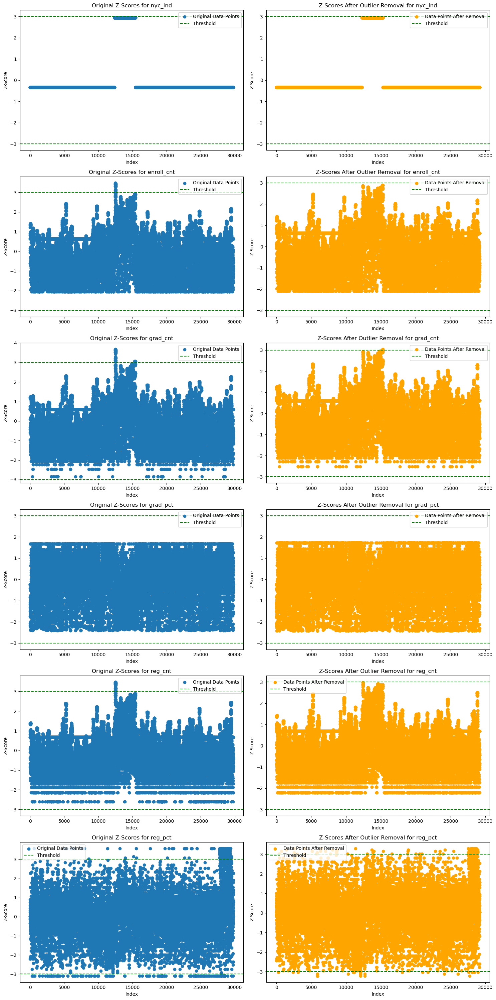

In [45]:
# Calculate Z-scores for each column
z_scores = zscore(df_selected_features[numeric_columns1], nan_policy='omit')

# Convert to a NumPy array to simplify indexing
z_scores = np.array(z_scores)

# Set a threshold for outlier detection
z_score_threshold = 3

# Identify outliers (any column with Z-score > threshold)
outliers = np.abs(z_scores) > z_score_threshold

# Remove outliers
df_no_outliers = df_selected_features[~outliers.any(axis=1)]

# Calculate Z-scores again after removing outliers
z_scores_no_outliers = zscore(df_no_outliers[numeric_columns1], nan_policy='omit')
z_scores_no_outliers = np.array(z_scores_no_outliers)

# Number of numerical columns
num_columns = len(numeric_columns1)

# Setting up the subplot grid for before and after comparison
n_rows = int(np.ceil(num_columns))  # Each row now represents before and after for each column
fig, axs = plt.subplots(n_rows, 2, figsize=(15, n_rows * 5))  # 2 columns for before and after
fig.subplots_adjust(hspace=0.4, wspace=0.4)

for i, column_name in enumerate(numeric_columns1):
    # Original Z-scores column
    z_scores_column = z_scores[:, i]
    # Z-scores column after outlier removal
    z_scores_column_no_outliers = z_scores_no_outliers[:, i]
    
    # Original data plotting
    ax_orig = axs[i, 0]
    ax_orig.scatter(range(len(z_scores_column)), z_scores_column, label='Original Data Points')
    ax_orig.axhline(y=z_score_threshold, color='g', linestyle='--', label='Threshold')
    ax_orig.axhline(y=-z_score_threshold, color='g', linestyle='--')
    ax_orig.set_title(f'Original Z-Scores for {column_name}')
    ax_orig.set_xlabel('Index')
    ax_orig.set_ylabel('Z-Score')
    ax_orig.legend()

    # Data after removing outliers plotting
    ax_no_outliers = axs[i, 1]
    ax_no_outliers.scatter(range(len(z_scores_column_no_outliers)), z_scores_column_no_outliers, label='Data Points After Removal', color='orange')
    ax_no_outliers.axhline(y=z_score_threshold, color='g', linestyle='--', label='Threshold')
    ax_no_outliers.axhline(y=-z_score_threshold, color='g', linestyle='--')
    ax_no_outliers.set_title(f'Z-Scores After Outlier Removal for {column_name}')
    ax_no_outliers.set_xlabel('Index')
    ax_no_outliers.set_ylabel('Z-Score')
    ax_no_outliers.legend()

plt.tight_layout()
plt.show();

Observation: As can be seen with the before removal and after removal graphs, the outliers beyond the Z-Score threshold of 3, have been removed.

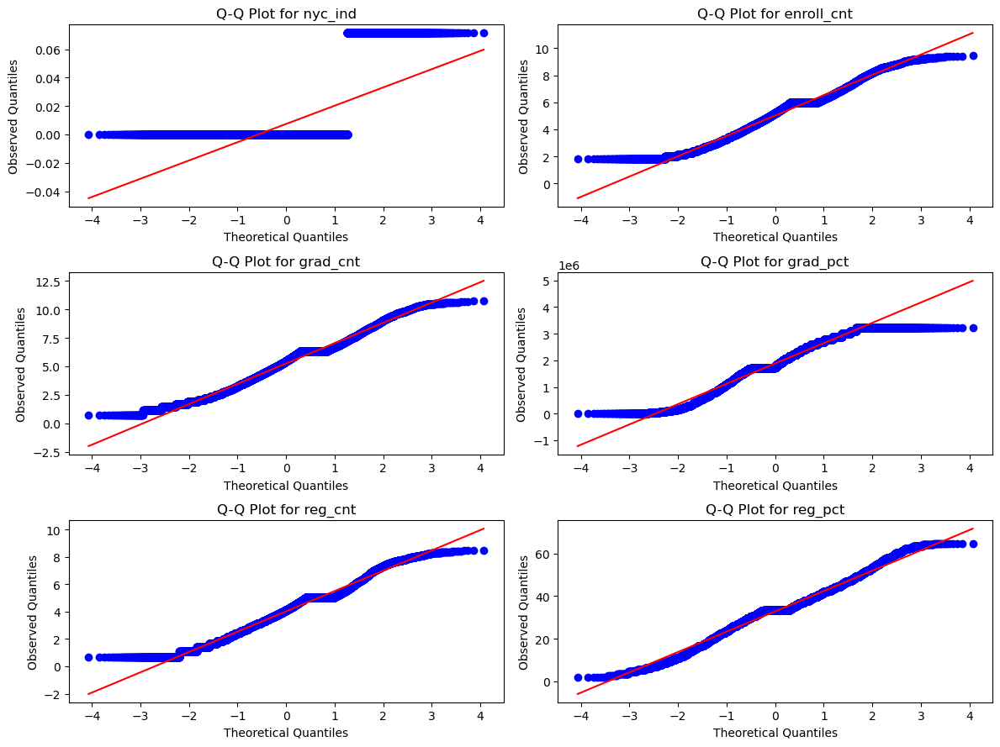

In [46]:
# Call the function with your DataFrame
plot_qq_plots(df_no_outliers)

After outliers handling with box cox method now results much better than earlier but not perfect as we expected.

__Box Plot for numerical variables after data wrangling__

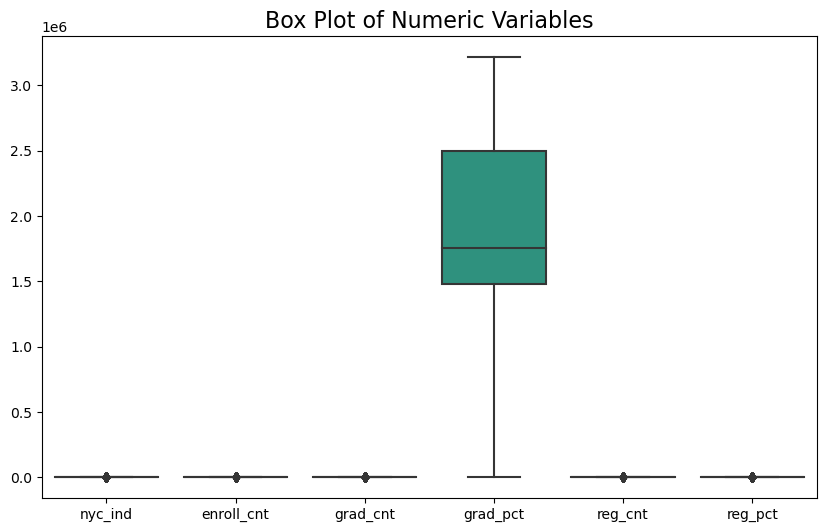

In [47]:
# Select only numerical columns for Box-Cox transformation
numeric_columns1 = df_no_outliers.select_dtypes(include=np.number).columns
# Box plot for each numeric variable
sns.boxplot(data=df_no_outliers[numeric_columns1], palette='viridis')
# Set the title of the plot
plt.title('Box Plot of Numeric Variables', fontsize=16)

# Display the plot
plt.show();

__Plot after removing outliers__

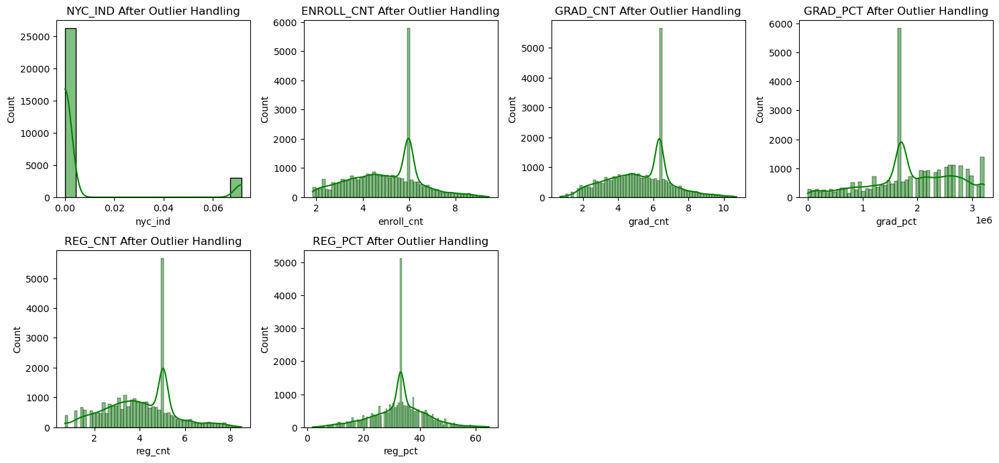

In [48]:
# Create histograms for selected columns after outlier handling
plt.figure(figsize=(15,10))  # Set the overall size of the subplot grid

# Loop through the selected columns to create individual histograms
for i, column in enumerate(df_no_outliers[numeric_columns1], 1):
    plt.subplot(3, 4, i)  # Create subplots in a 4x4 grid
    sns.histplot(df_no_outliers[column], kde=True, color="green")  # Plot histogram with KDE
    plt.title(f"{column.upper()} After Outlier Handling")  # Set the title of each subplot to the column name

plt.tight_layout()  # Adjust layout to prevent overlap of subplots
plt.show()  # Display the plot

After outlier handling we have found better result for our data distribution.

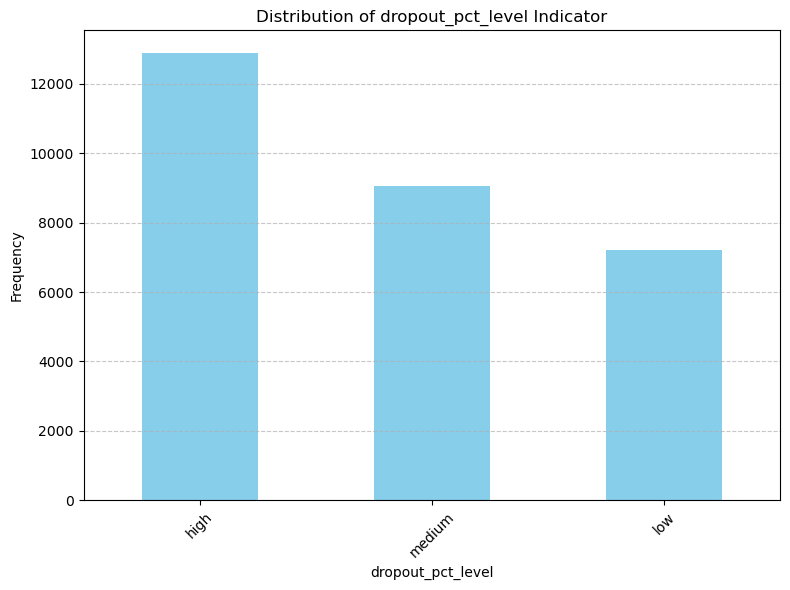

Descriptive Statistics of dropout_pct_level:
count        3.000000
mean      9726.000000
std       2892.387941
min       7222.000000
25%       8143.000000
50%       9064.000000
75%      10978.000000
max      12892.000000
Name: dropout_pct_level, dtype: float64


In [51]:
# Analyze the distribution of the "reg_pct_level" indicator variable
distribution = df_no_outliers['dropout_pct_level'].value_counts()

# Plot the distribution
plt.figure(figsize=(8, 6))
distribution.plot(kind='bar', color='skyblue')
plt.title('Distribution of dropout_pct_level Indicator')
plt.xlabel('dropout_pct_level')
plt.ylabel('Frequency')
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# Display the descriptive statistics
print("Descriptive Statistics of dropout_pct_level:")
print(distribution.describe())

In [52]:
df_no_outliers.columns

Index(['nrc_desc', 'county_name', 'nyc_ind', 'membership_desc',
       'subgroup_name', 'enroll_cnt', 'grad_cnt', 'grad_pct', 'reg_cnt',
       'reg_pct', 'dropout_pct_level'],
      dtype='object')

In [53]:
df_no_outliers.head()

,nrc_desc,county_name,nyc_ind,membership_desc,subgroup_name,enroll_cnt,grad_cnt,grad_pct,reg_cnt,reg_pct,dropout_pct_level
0,Urban-Suburban High Needs,ALBANY,0.0,2013-19 6yr outcome,All Students,7.107093,7.502211,9.772240e+05,6.142265,35.728011,high
1,Urban-Suburban High Needs,ALBANY,0.0,2013-19 6yr outcome,Female,6.269993,6.588421,1.237684e+06,5.456480,39.188071,high
2,Urban-Suburban High Needs,ALBANY,0.0,2013-19 6yr outcome,Male,6.305547,6.418728,7.194591e+05,5.254001,32.233885,high
3,Urban-Suburban High Needs,ALBANY,0.0,2013-19 6yr outcome,American Indian/Alaska Native,5.976555,6.349441,1.705200e+06,5.042058,33.247966,high
4,Urban-Suburban High Needs,ALBANY,0.0,2013-19 6yr outcome,Black,6.415959,6.599841,8.412907e+05,5.545784,37.807894,high


# Decision Tree + Random Forest Modeling

In [54]:
import pandas as pd
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.linear_model import SGDClassifier
from xgboost import XGBClassifier


__Convert categorical features into numerical ( One hot Encoding )__

In [55]:
# One-hot encode categorical variables
df_encoded = pd.get_dummies(df_no_outliers, columns=['nrc_desc', 'county_name', 'membership_desc', 'subgroup_name'])

# Separate features and target variable
X = df_encoded.drop(columns=['dropout_pct_level'])
y = df_encoded['dropout_pct_level']

# Split data into training and testing subsets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize Random Forest Classifier to obtain feature importances
rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)

# Extract feature importances
feature_importances = pd.Series(rf.feature_importances_, index=X_train.columns).sort_values(ascending=False)

# Select top features based on importance
selected_features = feature_importances[:4].index.tolist()  # Select top 4 features

In [56]:
selected_features

['grad_pct', 'enroll_cnt', 'grad_cnt', 'reg_cnt']

In [57]:
from sklearn.model_selection import GridSearchCV


# Define the parameter grid
param_grid = {
    'max_leaf_nodes': [None, 5, 10, 20, 50, 100]  # Try different values for max_leaf_nodes
}

# Initialize DecisionTreeClassifier
dt_classifier = DecisionTreeClassifier(random_state=42)

# Initialize GridSearchCV
grid_search = GridSearchCV(estimator=dt_classifier, param_grid=param_grid, cv=5, scoring='accuracy')

# Perform grid search
grid_search.fit(X_train[selected_features], y_train)

# Get the best parameters and best score
best_params = grid_search.best_params_
best_score = grid_search.best_score_

print("Best Parameters:", best_params)
print("Best Score (Accuracy):", best_score)


Best Parameters: {'max_leaf_nodes': 100}
Best Score (Accuracy): 0.7731992064929709


In [58]:
params = {'max_leaf_nodes': list(range(2, 100)), 'min_samples_split': [2, 3, 4]}
grid_search_cv = GridSearchCV(DecisionTreeClassifier(random_state=42), params, verbose=1, cv=3)

grid_search_cv.fit(X_train, y_train)

Fitting 3 folds for each of 294 candidates, totalling 882 fits


GridSearchCV(cv=3, estimator=DecisionTreeClassifier(random_state=42),
             param_grid={'max_leaf_nodes': [2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12,
                                            13, 14, 15, 16, 17, 18, 19, 20, 21,
                                            22, 23, 24, 25, 26, 27, 28, 29, 30,
                                            31, ...],
                         'min_samples_split': [2, 3, 4]},
             verbose=1)

In [59]:
grid_search_cv.best_estimator_

DecisionTreeClassifier(max_leaf_nodes=65, random_state=42)

In [60]:
y_pred = grid_search_cv.predict(X_test)
accuracy_score(y_test, y_pred)

0.8108293351610693

In [65]:
from sklearn.preprocessing import OneHotEncoder

# Encode the target variable y_train using one-hot encoding
onehot_encoder = OneHotEncoder()
y_train_encoded = onehot_encoder.fit_transform(y_train.values.reshape(-1, 1))

# Convert y_train_encoded to array
y_train_encoded_array = y_train_encoded.toarray()

# Initialize XGBoost Classifier
xgb_model = XGBClassifier()

# Train and evaluate the model using cross-validation
xgb_scores = cross_val_score(xgb_model, X_train[explanatory_variables], y_train_encoded_array, cv=5, scoring='accuracy')

# Display mean accuracy scores
print("Mean Accuracy Scores (XGBoost):", xgb_scores.mean())



Mean Accuracy Scores (XGBoost): 0.7376406086343534


Now, let's construct and evaluate each model using cross-validation:

In [69]:
from sklearn.preprocessing import LabelEncoder

# Encode the target variable y_train
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train)

# Initialize models
models = {
    'Decision Tree': DecisionTreeClassifier(),
    'Random Forest': RandomForestClassifier(),
    'Gradient Boosting': GradientBoostingClassifier(),
    'Stochastic Gradient Descent': SGDClassifier(),
    'XG Boost': XGBClassifier()
}

# Train and evaluate models using cross-validation
results = {}
for name, model in models.items():
    scores = cross_val_score(model, X_train[explanatory_variables], y_train_encoded, cv=5, scoring='accuracy')
    results[name] = scores.mean()

# Display mean accuracy scores for each model
print("Mean Accuracy Scores:")
for name, score in results.items():
    print(f"{name}: {score}")



Mean Accuracy Scores:
Decision Tree: 0.7294154153184149
Random Forest: 0.758076149218817
Gradient Boosting: 0.7783828706285858
Stochastic Gradient Descent: 0.3118385629073087
XG Boost: 0.7802678077046676


# Select Models

Evaluating and Selecting the Best Classification Model: We'll evaluate the performance of each model using cross-validation and select the best model based on a chosen metric (e.g., accuracy).

Finally, we'll apply the preferred model to the testing subset and assess its performance:

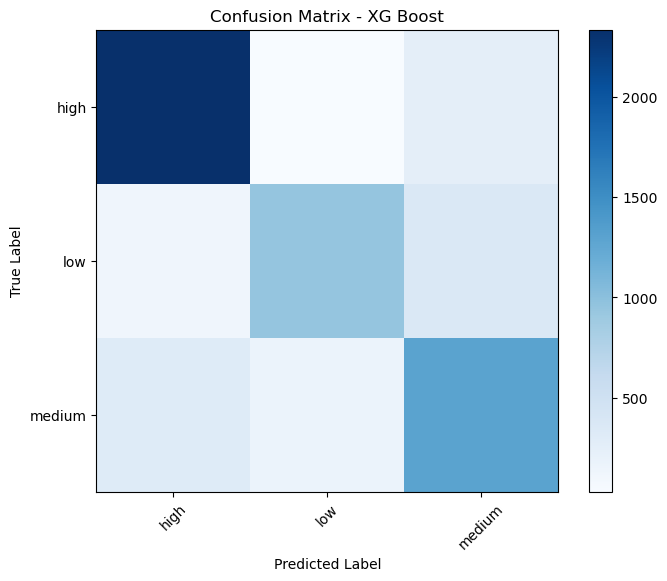

Confusion Matrix - XG Boost:
[[2335   32  251]
 [ 122  947  368]
 [ 316  173 1292]]


In [80]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt

# Find the best model based on mean accuracy scores
best_model_name = max(results, key=results.get)
best_model = models[best_model_name]

# Train the best model on the full training subset
best_model.fit(X_train[explanatory_variables], y_train_encoded)

# Predict on the testing subset
y_pred = best_model.predict(X_test[explanatory_variables])

# Encode the target variable y_test
y_test_encoded = label_encoder.transform(y_test)

# Calculate the confusion matrix
conf_matrix = confusion_matrix(y_test_encoded, y_pred)

# Plot the confusion matrix
plt.figure(figsize=(8, 6))
plt.imshow(conf_matrix, interpolation='nearest', cmap=plt.cm.Blues)
plt.title(f'Confusion Matrix - {best_model_name}')
plt.colorbar()
tick_marks = np.arange(len(label_encoder.classes_))
plt.xticks(tick_marks, label_encoder.classes_, rotation=45)
plt.yticks(tick_marks, label_encoder.classes_)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

# Display the confusion matrix
print(f"Confusion Matrix - {best_model_name}:")
print(conf_matrix)


# Conclusion


In this project, we embarked on a comprehensive journey through the data science lifecycle, focusing on implementing and evaluating to predict regional level percentage low, medium and high counts in NY State High Schools based on various characteristics. The dataset provided offered a deep dive into the graduation metrics for the 2018-2019 school year, sourced from the NY State Education Department. It included over 73,000 observations with 19 attributes, requiring a detailed exploration and preparation phase to ensure the data was fit for analysis.

During the exploratory data analysis (EDA) phase, we utilized visualization and statistical methods to understand the dataset's structure, identify patterns, and detect outliers and anomalies. This phase was crucial for identifying the relationships between variables and the overall distribution of the data. We meticulously prepared the data, converting categorical variables into a numerical format, addressing missing values with KNN imputation, and handling outliers through statistical methods. 

For classification modeling, we selected models based on their appropriateness for the data and the prediction task. The model XG Boost accommodate the distribution of the level percentage category. 

After rigorous evaluation, the best-performing model was selected based on criteria such as Accuracy. The chosen model XG Boost, it offered the most accurate predictions while providing valuable insights into the data's underlying patterns and relationships.

In conclusion, this project not only achieved its goal of implementing and evaluating clasification models to predict regional percentage level counts but also highlighted the importance of thorough data preparation and the power of model interpretability. The findings from this project can be utilized by educational institutions and policymakers to identify and address factors contributing to high school reg level percent category whether low or medium or high, ultimately helping to improve graduation rates across NY State.

# Reference
1. Type of school district information details: https://www.oms.nysed.gov/faru/Articles/ChangesinDebtPayments.htm
2. Data source website: https://data.nysed.gov/
3. https://github.com/ageron/handson-ml2/blob/master/06_decision_trees.ipynb
